1 模型的思想

　　Transformer中抛弃了传统的CNN和RNN，整个网络结构完全是由Attention机制组成。 作者采用Attention机制的原因是考虑到RNN（或者LSTM，GRU等）的计算是顺序的，RNN相关算法只能从左向右依次计算或者从右向左依次计算，这种机制带来了两个问题：　

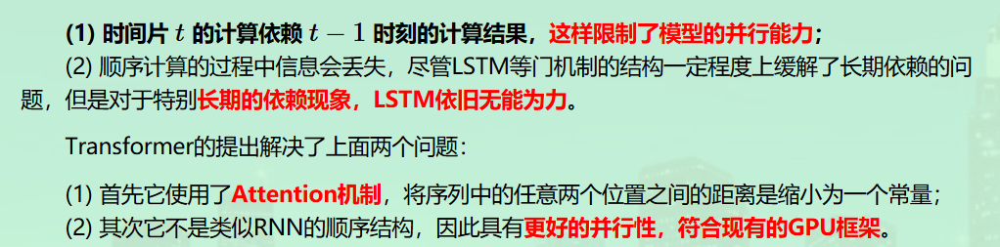

2.模型的架构

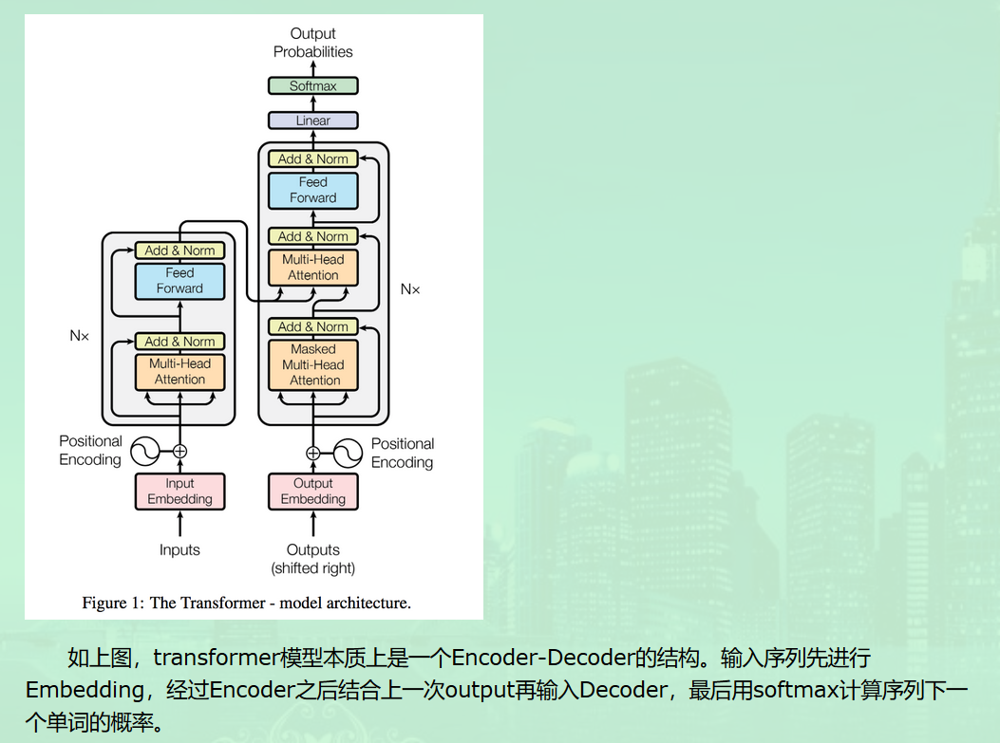

In [1]:
import torch.nn as nn

In [2]:
class Embeddings(nn.Module):
    def __init__(self,d_model,vocab):
        super(Embeddings,self).__init__()
        self.lut=nn.Embedding(vocab,d_model)
        self.d_model=d_model#表示embedding的维度
    def forward(self,x):
        return self.lut(x)*math.sqrt(self.d_model)
    
#其中d_model表示embedding的维度，即词向量的维度；vocab表示词汇表的数量。

3.2 Positional Embedding

　　在RNN中，对句子的处理是一个个word按顺序输入的。但在 Transformer 中，输入句子的所有word是同时处理的，没有考虑词的排序和位置信息。因此，Transformer 的作者提出了加入 “positional encoding” 的方法来解决这个问题。“positional encoding“”使得 Transformer 可以衡量 word 位置有关的信息。

　　如何实现具有位置信息的encoding呢？作者提供了两种思路：

    通过训练学习 positional encoding 向量；
    使用公式来计算 positional encoding向量。

　　试验后发现两种选择的结果是相似的，所以采用了第2种方法，优点是不需要训练参数，而且即使在训练集中没有出现过的句子长度上也能用。

　　Positional Encoding的公式如下：

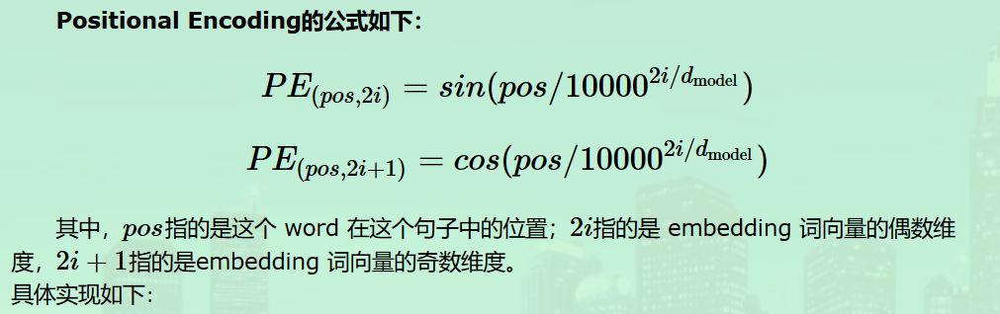

In [3]:
import torch.nn as nn
# Positional Encoding
class PositionalEncoding(nn.Module):
    "实现PE功能"
    def __init__(self, d_model, dropout, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
         
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0., max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0., d_model, 2) *
                             -(math.log(10000.0) / d_model))
         
        pe[:, 0::2] = torch.sin(position * div_term)    # 偶数列
        pe[:, 1::2] = torch.cos(position * div_term)    # 奇数列
        pe = pe.unsqueeze(0)           # [1, max_len, d_model]
        self.register_buffer('pe', pe)
         
    def forward(self, x):
        x = x + Variable(self.pe[:, :x.size(1)], requires_grad=False)
        return self.dropout(x)

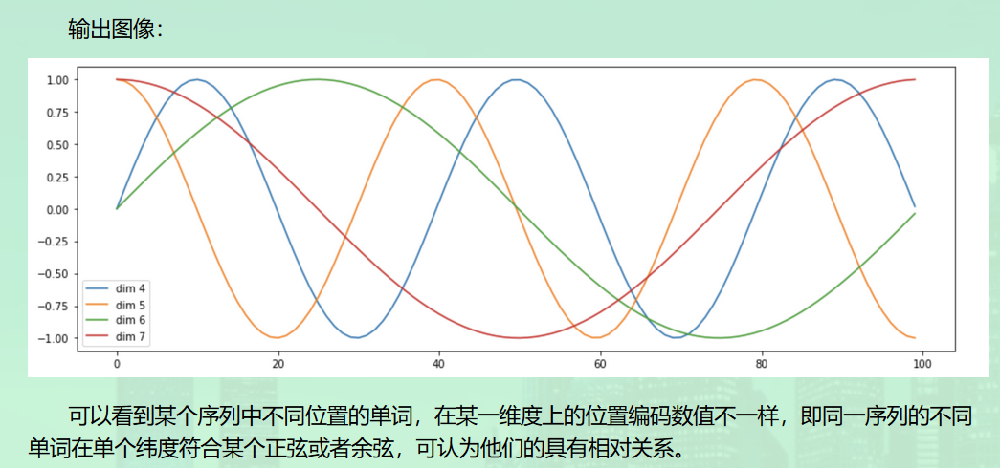

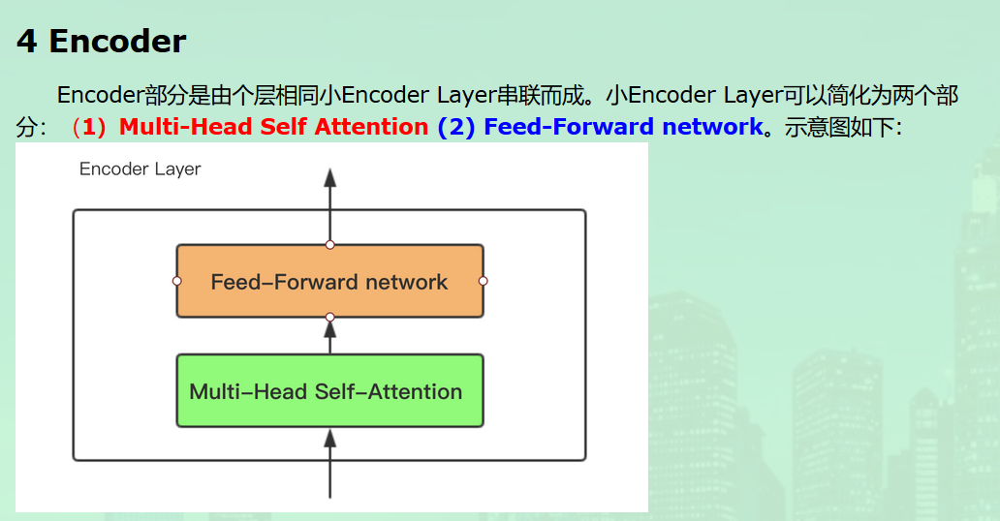

事实上multi head self attention 和feed forward network之后都接了一层add 和norm

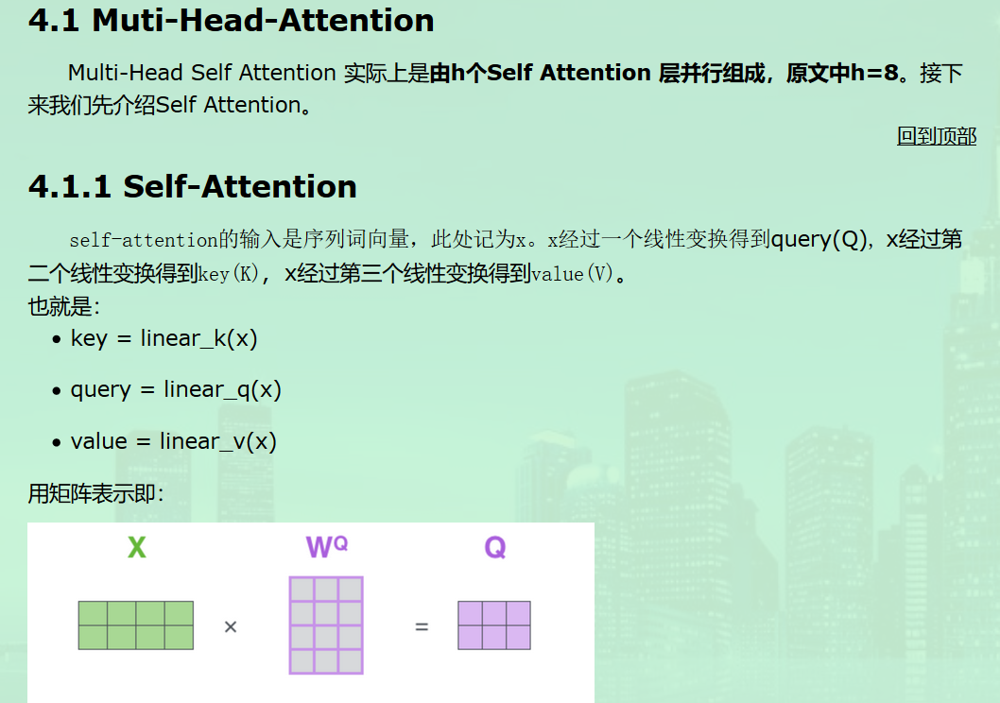

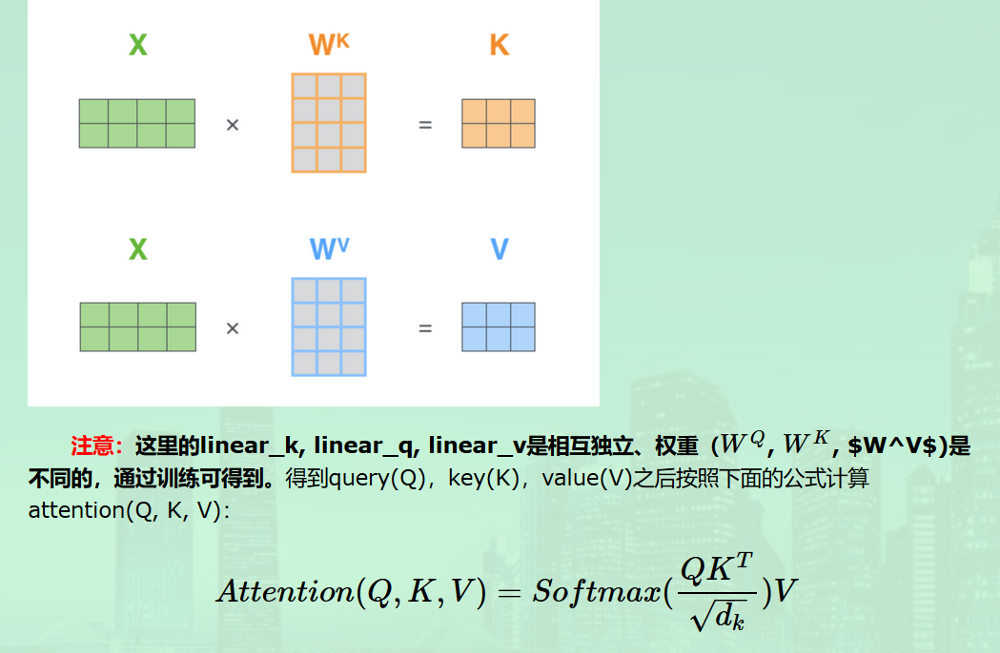

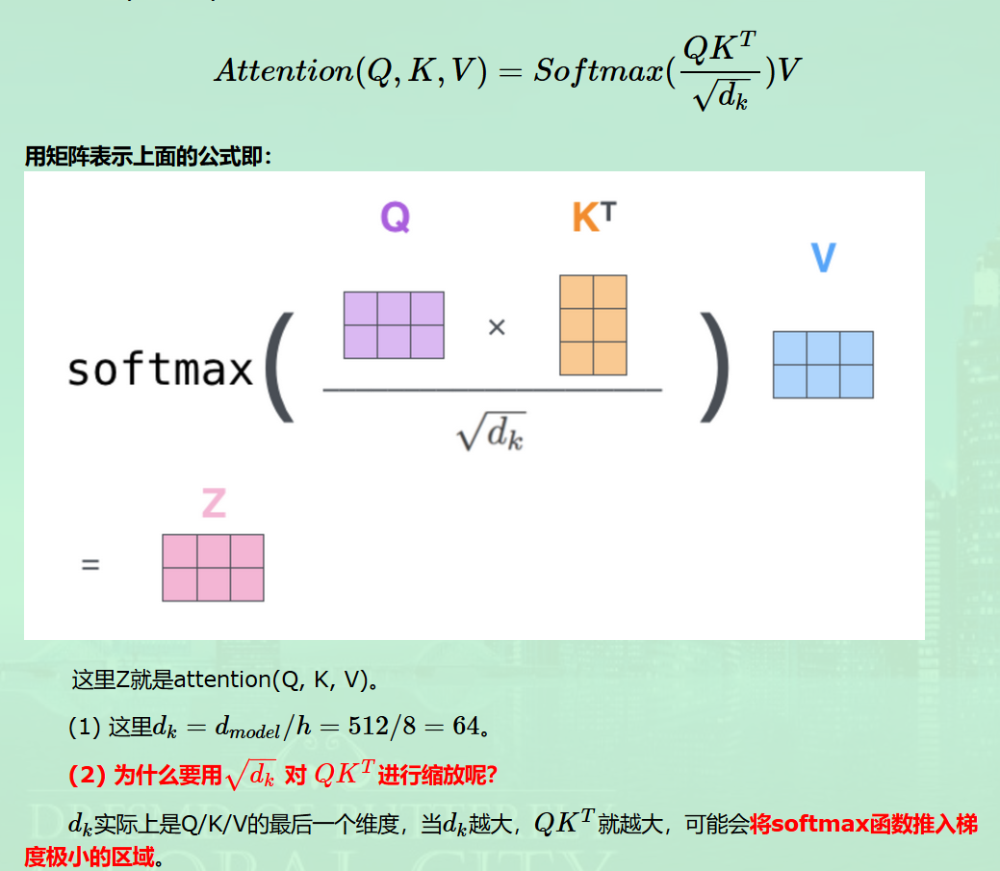

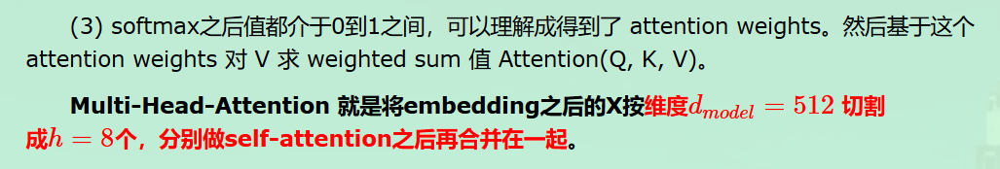

In [4]:
class MultiHeadedAttention(nn.Module):
    def __init__(self,h,d_model,dropout=0.1):
        super(MultiHeadAttention,self).__init__()
        assert d_model % h ==0
        self.d_k=d_model//h
        self.h=h
        self.linears=clones(nn.Linear(d_model,d_model),4)
        self.attn=None
        self.dropout=nn.Dropout(p=dropout)
    def forward(self,query,key,value,mask=None):
        '''
        实现MultiHeadedAttention
        输入的q,k,v是形状[batch,L,d_model]
        输出的x的形状同上
        '''
        if mask is not None:
            mask=mask.unsqueeze(1)
        nbatches=query.size(0)
        
        #1)这一步qkv变化，【batch，L，d_model】->【batch,h,L,d_model/h】
        query,key,value=\
        [l(x).view(nbatches,-1,self.h,self.d_k).transpose(1,2)
        for l,x in zip(self.linears,(query,key,value))]
        #2)计算注意力attn，得到attn*v 与attn
        #qkv：【batch,h,L,d_model/h】-->x:[b,h,L,d_model/h],attn[b,h,L,L]
        x,self.attn=attention(query,key,value,mask=mask,dropout=self.dropout)
        #3)上一步的结果合并在一起还原成原始输入序列的形状
        x=x.transpose(1,2).contiguous().view(nbatches,-1,self.h*self.d_k)
        #最后再过一个线性层
        return self.linears[-1](x)
























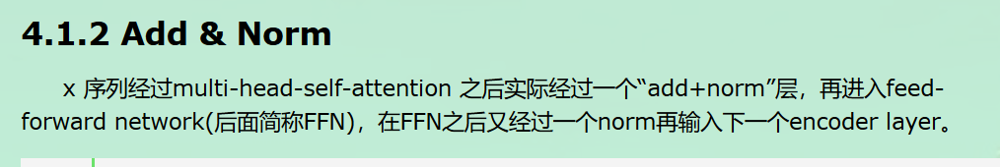

In [5]:
class LayerNorm(nn.Module):
    """构造一个layernorm模块"""
    def __init__(self, features, eps=1e-6):
        super(LayerNorm, self).__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps
 
    def forward(self, x):
        "Norm"
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2
 
 
class SublayerConnection(nn.Module):
    """Add+Norm"""
    def __init__(self, size, dropout):
        super(SublayerConnection, self).__init__()
        self.norm = LayerNorm(size)
        self.dropout = nn.Dropout(dropout)
 
    def forward(self, x, sublayer):
        "add norm"
        return x + self.dropout(sublayer(self.norm(x)))

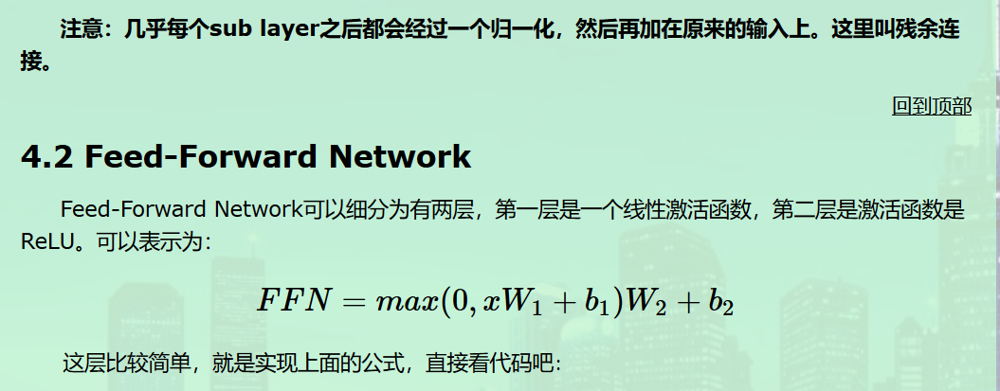

In [6]:
# Position-wise Feed-Forward Networks
class PositionwiseFeedForward(nn.Module):
    "实现FFN函数"
    def __init__(self, d_model, d_ff, dropout=0.1):
        super(PositionwiseFeedForward, self).__init__()
        self.w_1 = nn.Linear(d_model, d_ff)
        self.w_2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)
 
    def forward(self, x):
        return self.w_2(self.dropout(F.relu(self.w_1(x))))

总的来说Encoder 是由上述小encoder layer 6个串行叠加组成。encoder sub layer主要包含两个部分：

    SubLayer-1 做 Multi-Headed Attention
    SubLayer-2 做 Feed Forward Neural Network

　　来看下Encoder主架构的代码：

In [7]:
def clones(module, N):
    "产生N个相同的层"
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])
 
class Encoder(nn.Module):
    """N层堆叠的Encoder"""
    def __init__(self, layer, N):
        super(Encoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)
         
    def forward(self, x, mask):
        "每层layer依次通过输入序列与mask"
        for layer in self.layers:
            x = layer(x, mask)
        return self.norm(x)

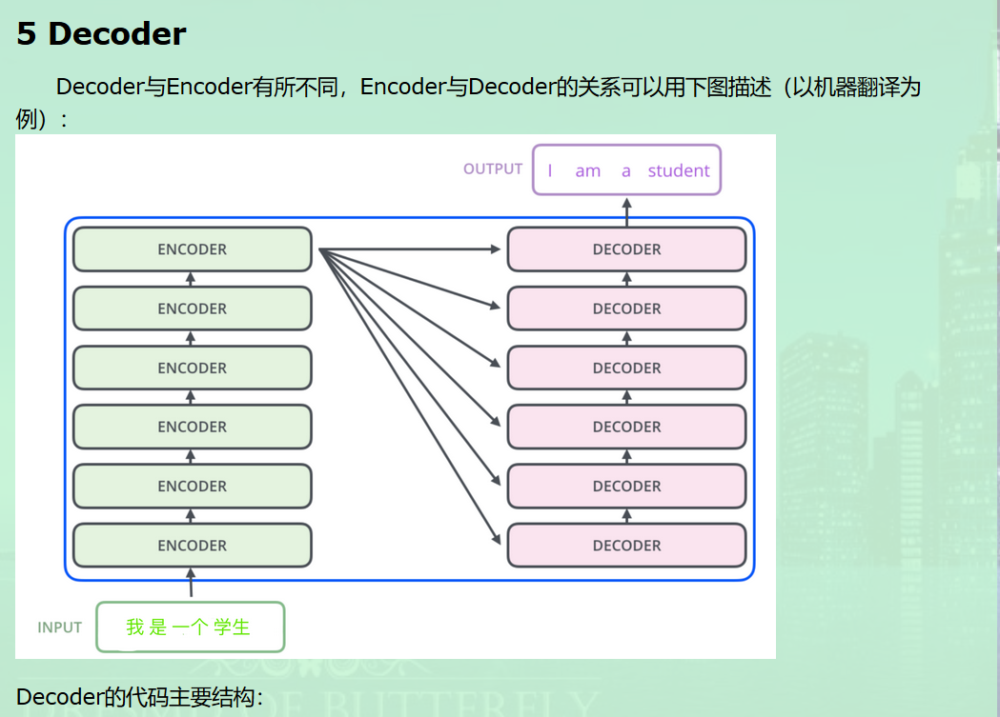

In [8]:
# Decoder部分
class Decoder(nn.Module):
    """带mask功能的通用Decoder结构"""
    def __init__(self, layer, N):
        super(Decoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)
         
    def forward(self, x, memory, src_mask, tgt_mask):
        for layer in self.layers:
            x = layer(x, memory, src_mask, tgt_mask)
        return self.norm(x)

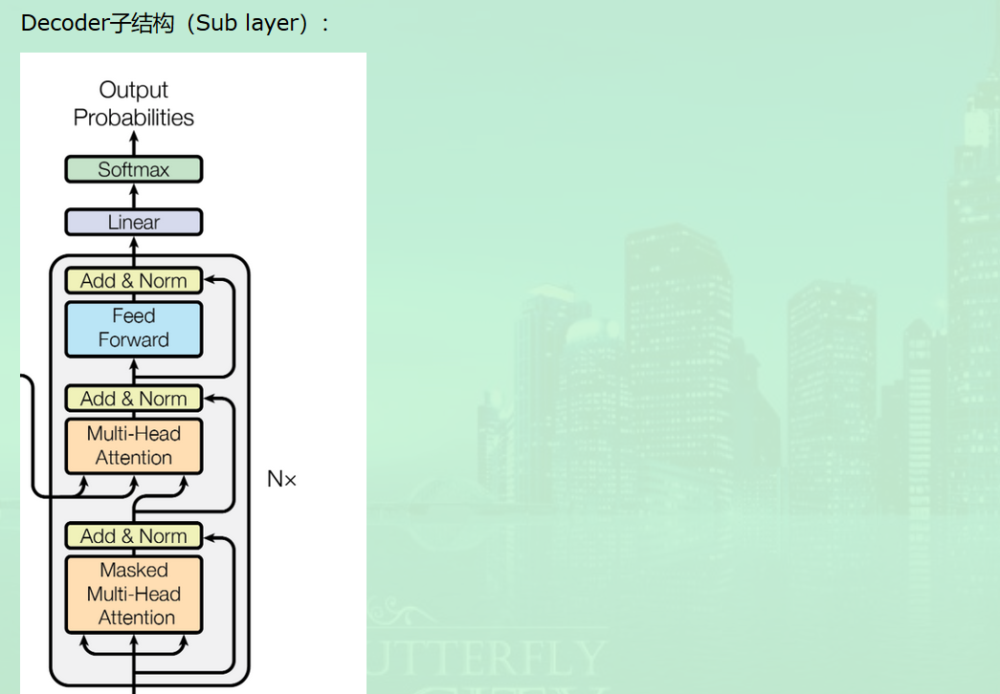

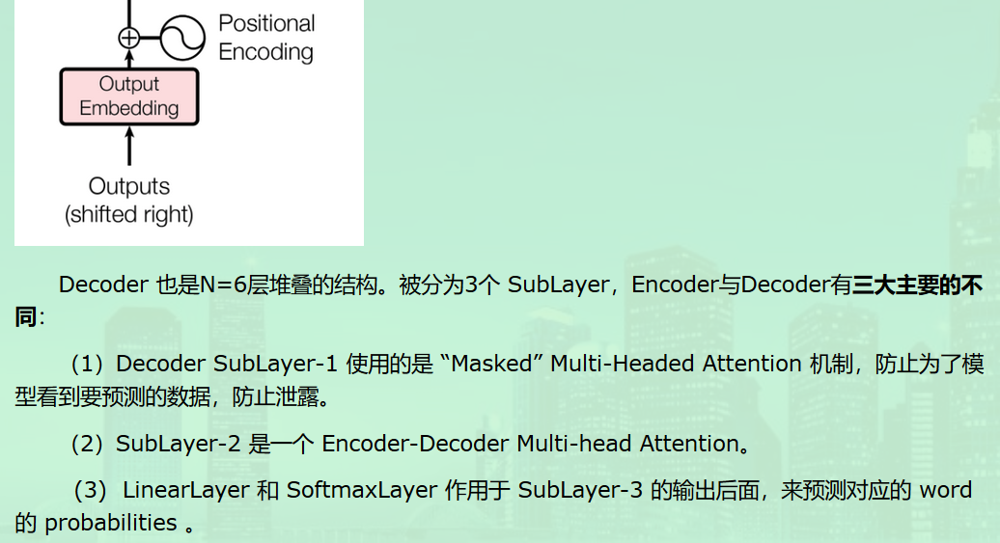

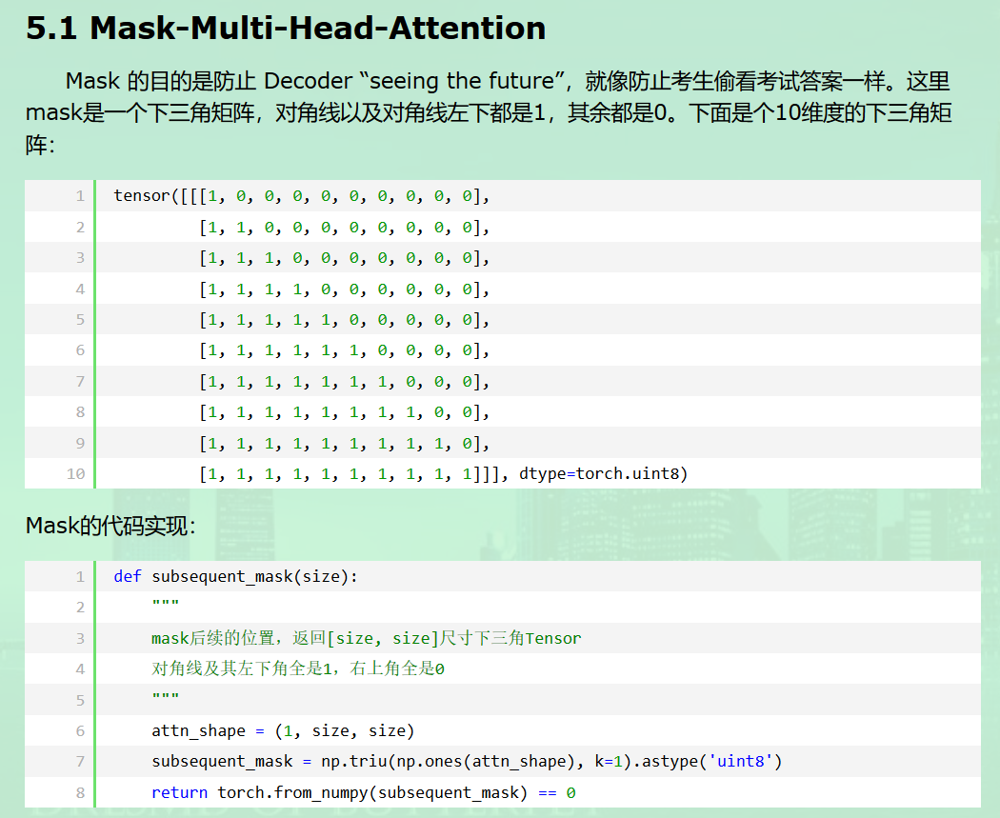

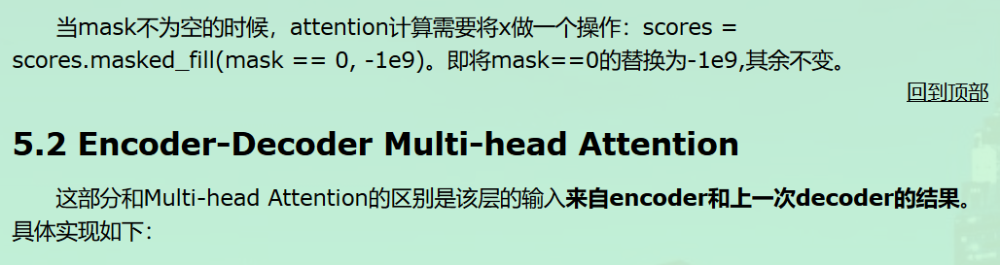

In [9]:
class DecoderLayer(nn.Module):
    "Decoder is made of self-attn, src-attn, and feed forward (defined below)"
    def __init__(self, size, self_attn, src_attn, feed_forward, dropout):
        super(DecoderLayer, self).__init__()
        self.size = size
        self.self_attn = self_attn
        self.src_attn = src_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 3)
  
    def forward(self, x, memory, src_mask, tgt_mask):
        "将decoder的三个Sublayer串联起来"
        m = memory
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x, tgt_mask))
        x = self.sublayer[1](x, lambda x: self.src_attn(x, m, m, src_mask))
        return self.sublayer[2](x, self.feed_forward)

In [10]:
class Generator(nn.Module):
    """
    Define standard linear + softmax generation step。
    定义标准的linear + softmax 生成步骤。
    """
    def __init__(self, d_model, vocab):
        super(Generator, self).__init__()
        self.proj = nn.Linear(d_model, vocab)
 
    def forward(self, x):
        return F.log_softmax(self.proj(x), dim=-1)

在训练过程中，模型没有收敛得很好时，Decoder预测产生的词很可能不是我们想要的。这个时候如果再把错误的数据再输给Decoder，
就会越跑越偏。这个时候怎么办？

　 （1）在训练过程中可以使用 “teacher forcing”。因为我们知道应该预测的word是什么，那么可以给Decoder喂一个正确的结果作为输入。

　　(2）除了选择最高概率的词 (greedy search)，还可以选择是比如 “Beam Search”，可以保留topK个预测的word。 Beam Search 方法不
   再是只得到一个输出放到下一步去训练了，我们可以设定一个值，
   拿多个值放到下一步去训练，这条路径的概率等于每一步输出的概率的乘积。

6 Transformer的优缺点
回到顶部
6.1 优点

　　（1）每层计算复杂度比RNN要低。

　　（2）可以进行并行计算。

　　（3）从计算一个序列长度为n的信息要经过的路径长度来看, CNN需要增加卷积层数来扩大视野，RNN需要从1到n逐个进行计算，而Self-attention只需要一步矩阵计算就可以。Self-Attention可以比RNN更好地解决长时依赖问题。当然如果计算量太大，比如序列长度N大于序列维度D这种情况，也可以用窗口限制Self-Attention的计算数量。

　　（4）从作者在附录中给出的栗子可以看出，Self-Attention模型更可解释，Attention结果的分布表明了该模型学习到了一些语法和语义信息。
回到顶部
6.2 缺点

　　在原文中没有提到缺点，是后来在Universal Transformers中指出的，主要是两点：

　　（1）实践上：有些RNN轻易可以解决的问题transformer没做到，比如复制string，或者推理时碰到的sequence长度比训练时更长（因为碰到了没见过的position embedding）。

　　（2）理论上：transformers不是computationally universal(图灵完备)，这种非RNN式的模型是非图灵完备的的，无法单独完成NLP中推理、决策等计算问题（包括使用transformer的bert模型等等）。

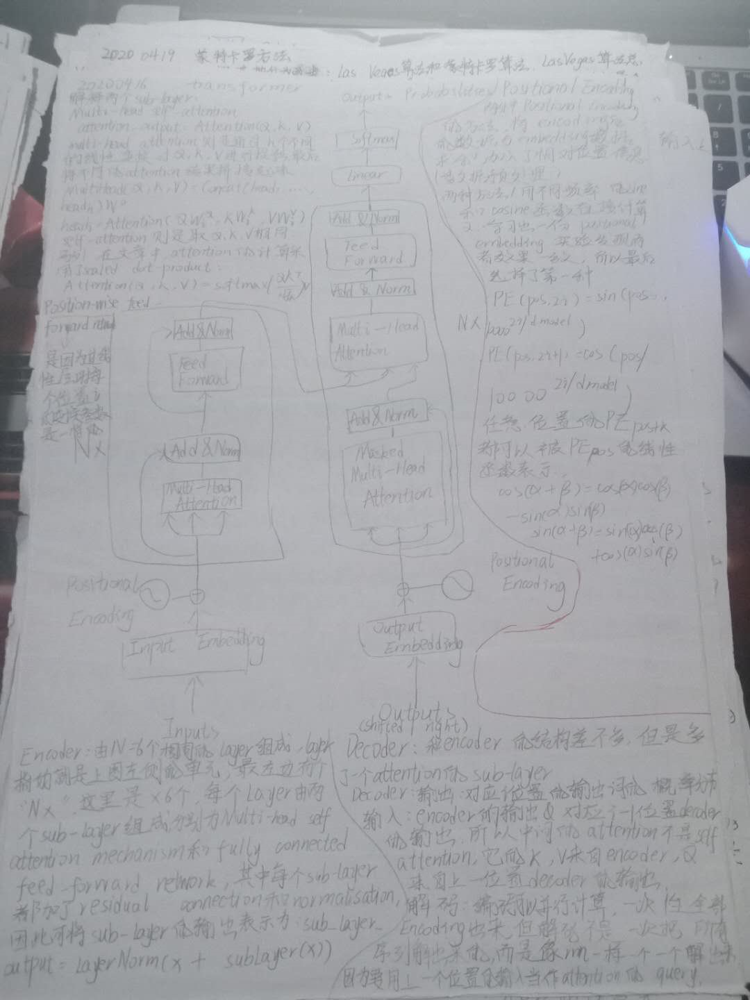

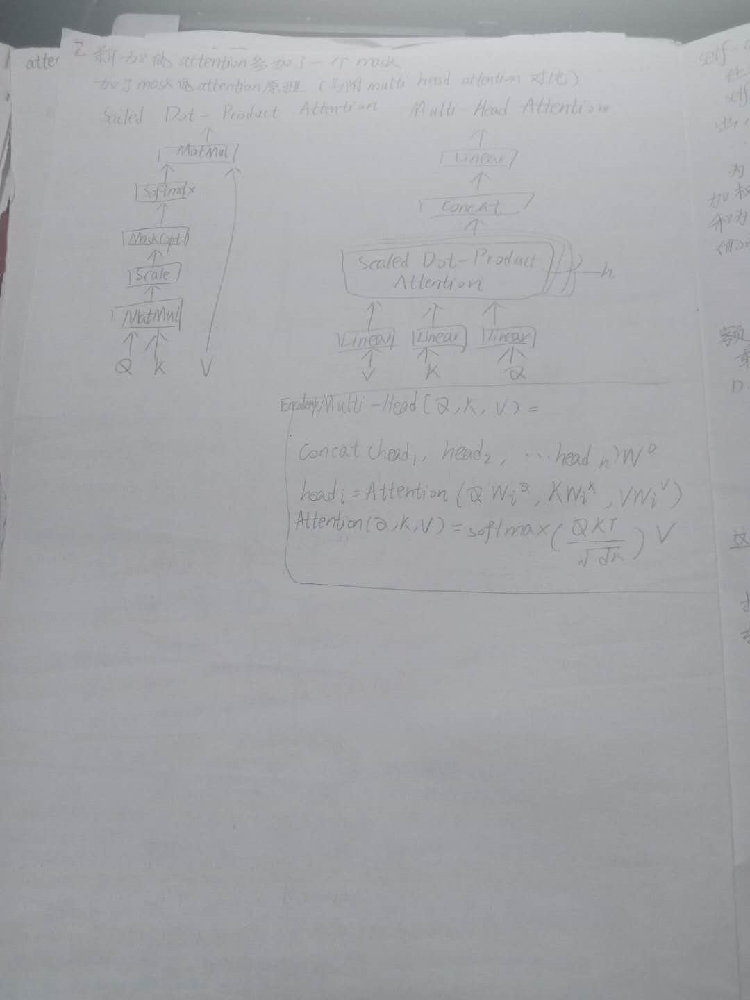

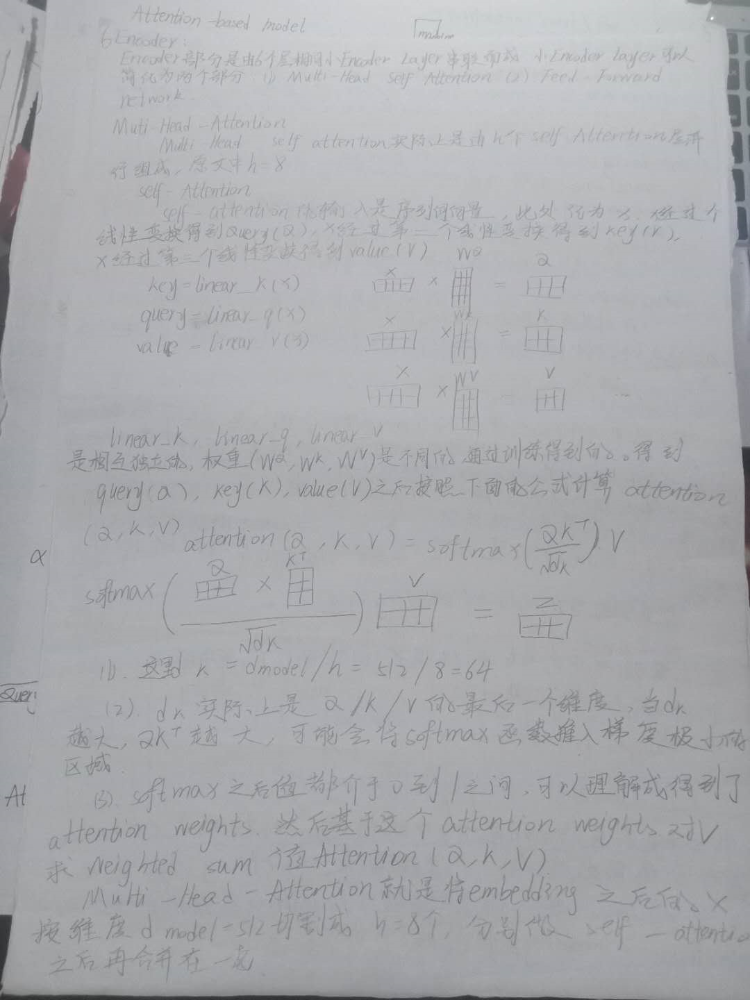

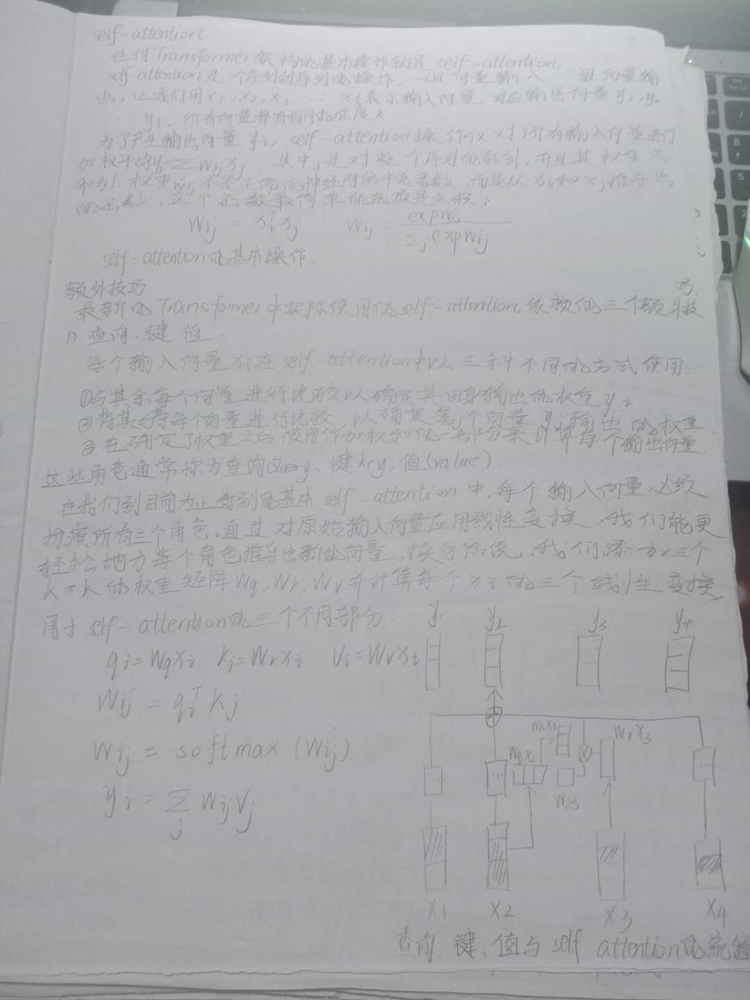

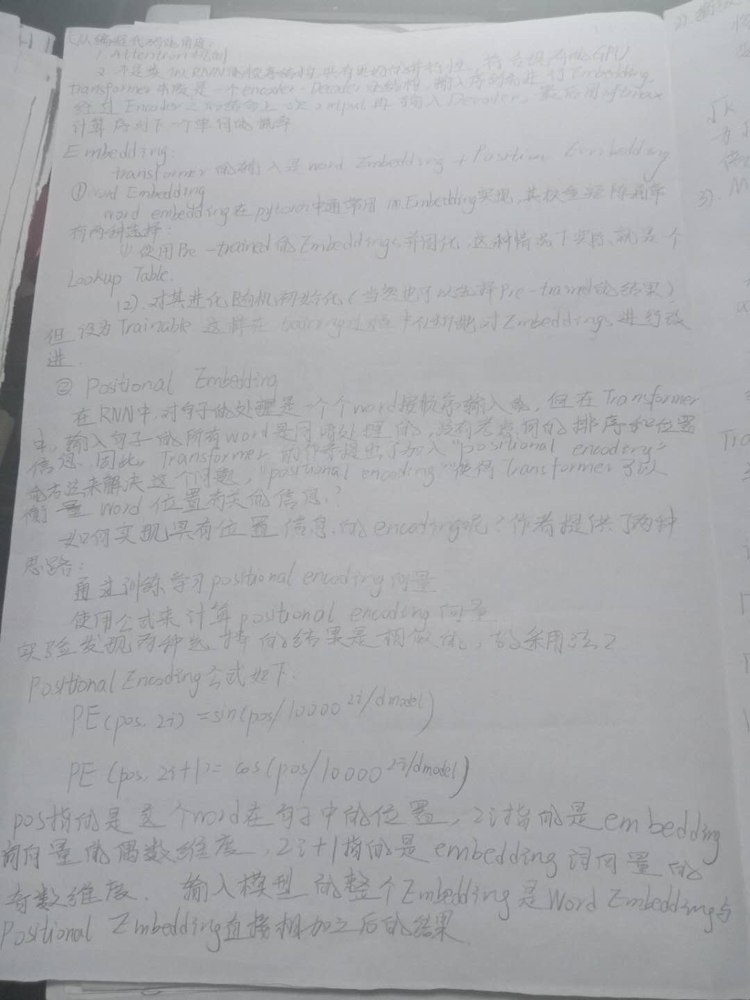

...

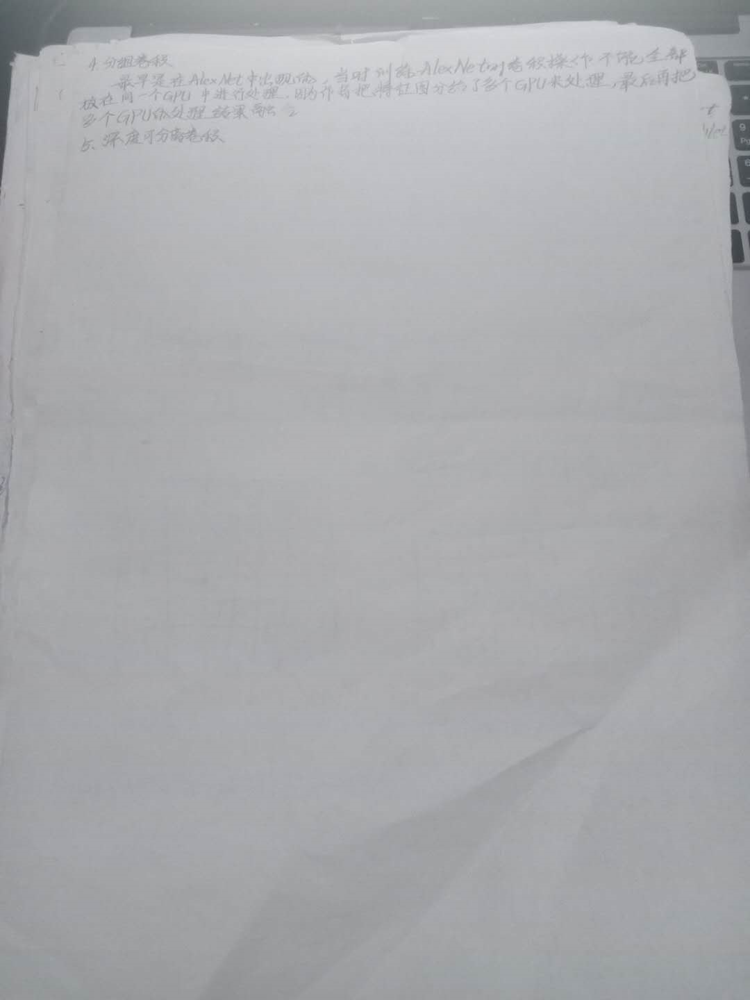

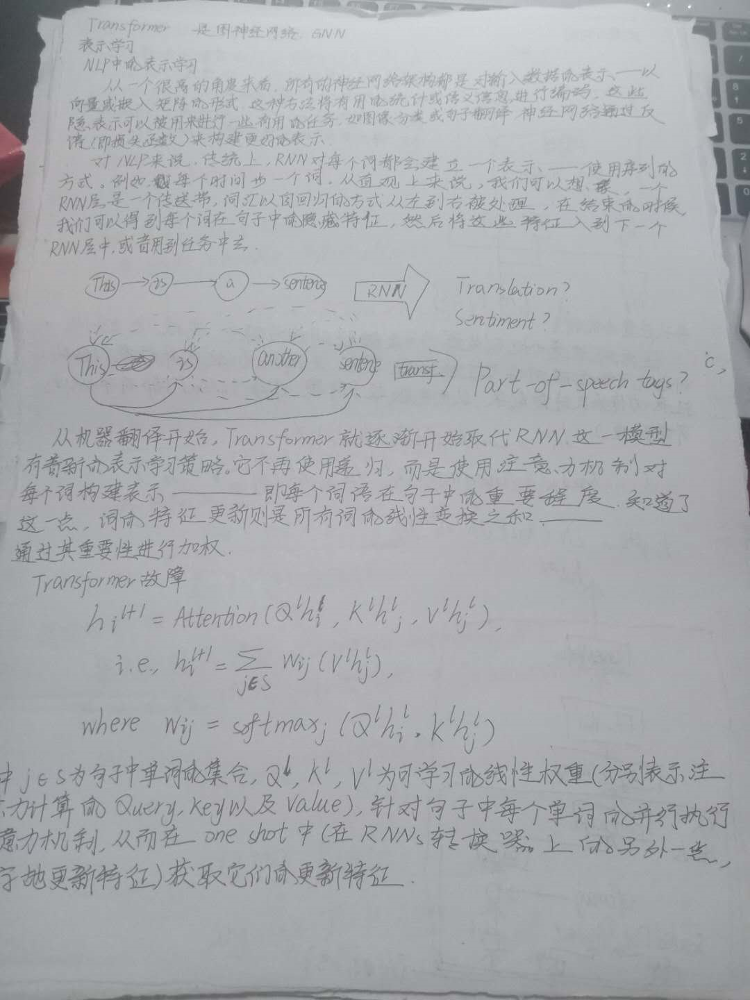

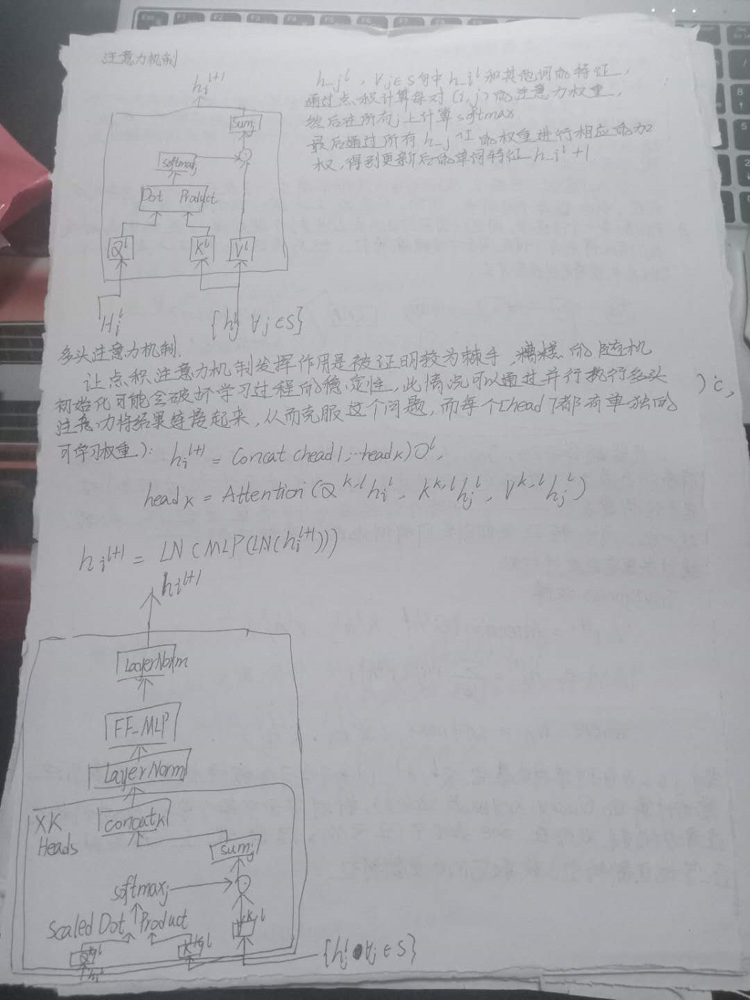

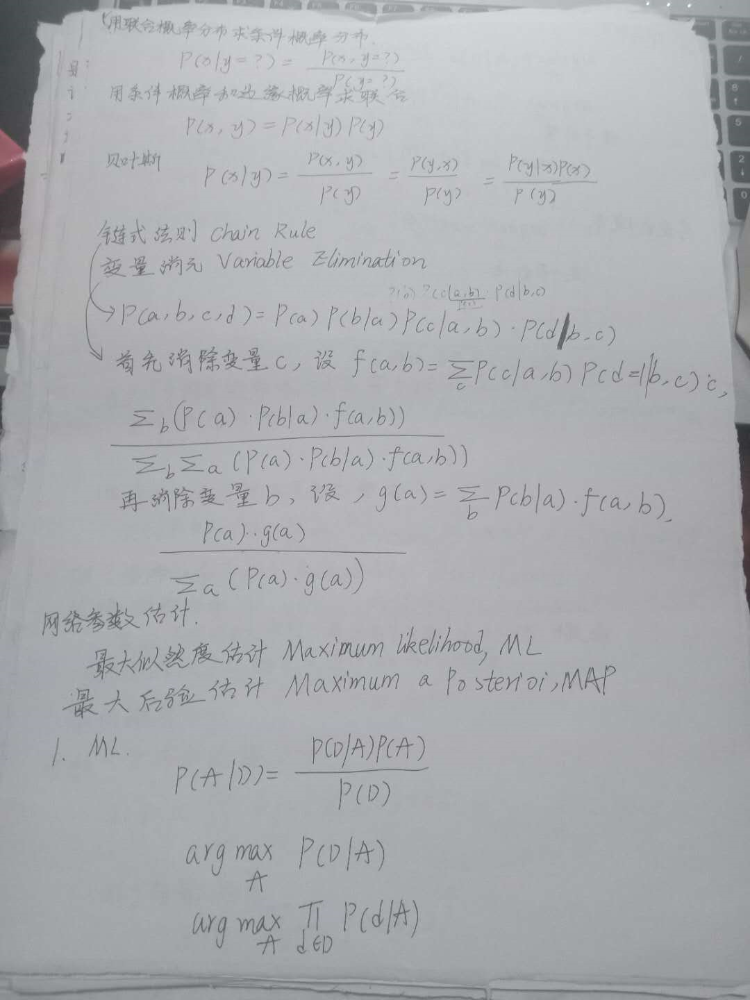

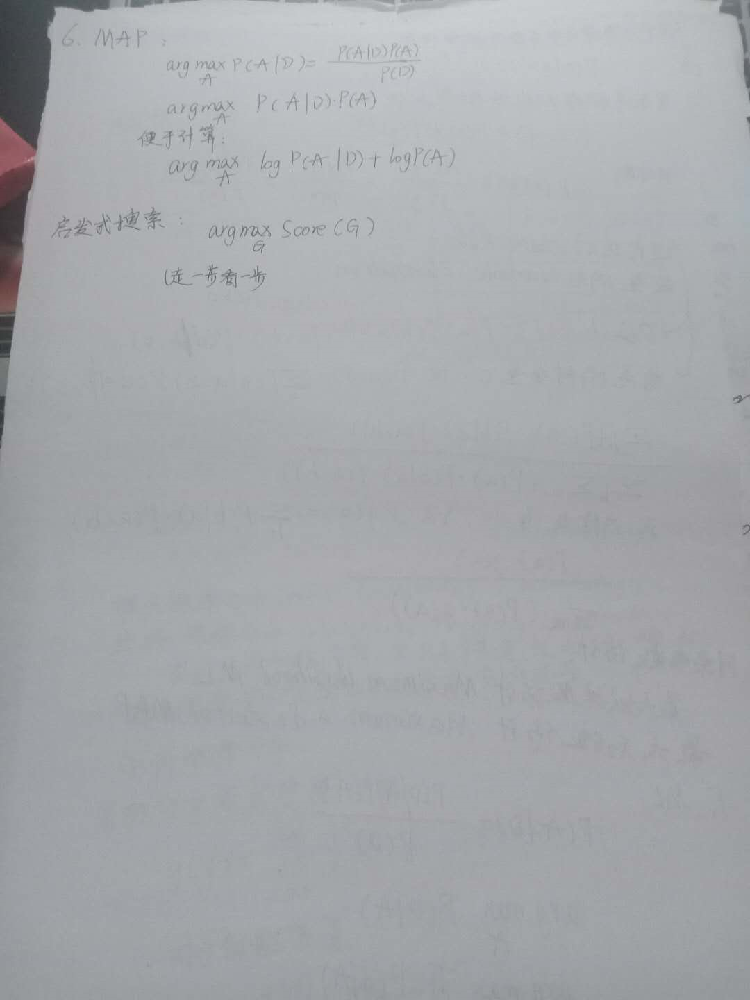